In [1]:
%matplotlib inline
import os, sys
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
import cv2
import re
import util
from model import AffineNet
from model import AffineNet1

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [2]:
path = "DATA3/DATASETS/DATASET_FINAL_v2/"

dataset = np.load(path+'dataset.npz')

imgs_rgb = dataset['rgb']
imgs_ir = dataset['ir']
imgs_mask_rgb = dataset['mask_rgb']
imgs_mask_ir = dataset['mask_ir']

In [3]:
print(imgs_rgb.shape, imgs_ir.shape, imgs_mask_rgb.shape, imgs_mask_ir.shape)

(10431, 240, 320, 3) (10431, 240, 320, 3) (10431, 240, 320) (10431, 240, 320)


In [4]:
model = AffineNet().to(device)

In [5]:
beg = 1000
end = 2000

imRGB = util.parseImages(imgs_mask_rgb, end)
imRGB = imRGB[beg:end, ...]

imIR = util.parseImages(imgs_mask_ir, end)
imIR = imIR[beg:end, ...]

imIR.shape

torch.Size([1000, 1, 240, 320])

In [9]:
mini_batch_size = 20
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss()

In [11]:
model = model.to(device)

util.train2(model, imRGB, imIR, 20, mini_batch_size, criterion, optimizer)

epoch 1: loss = 5.416226048022509
epoch 2: loss = 5.391828656196594
epoch 3: loss = 5.361598249524832
epoch 4: loss = 5.337082877755165
epoch 5: loss = 5.320185016840696
epoch 6: loss = 5.3000369146466255
epoch 7: loss = 5.280742077156901
epoch 8: loss = 5.262101363390684
epoch 9: loss = 5.250983711332083
epoch 10: loss = 5.23657900094986
epoch 11: loss = 5.235291425138712
epoch 12: loss = 5.235590161755681
epoch 13: loss = 5.218637255951762
epoch 14: loss = 5.203855009749532
epoch 15: loss = 5.1957813035696745
epoch 16: loss = 5.191220251843333
epoch 17: loss = 5.190686993300915
epoch 18: loss = 5.228524887934327
epoch 19: loss = 5.224852479994297
epoch 20: loss = 5.184119498357177


C:\Users\lucaw\Documents\EPFL\BachelorProject\util.py:124: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15, 15))


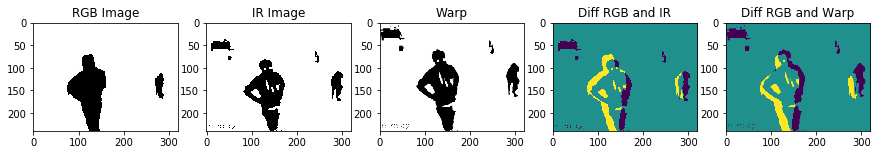

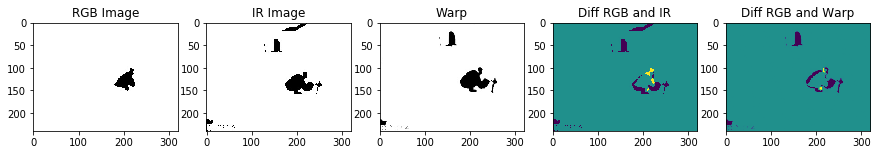

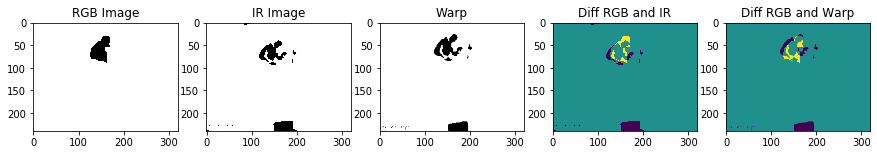

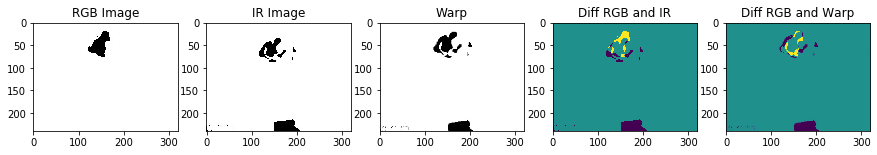

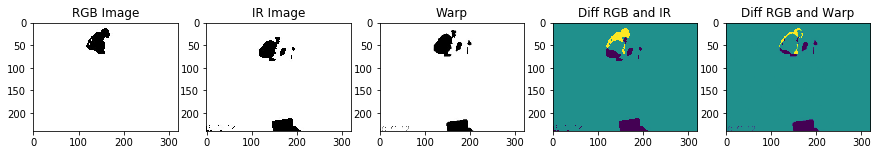

...

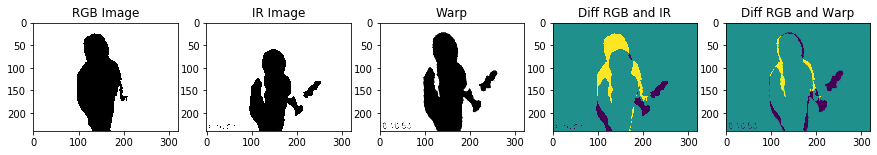

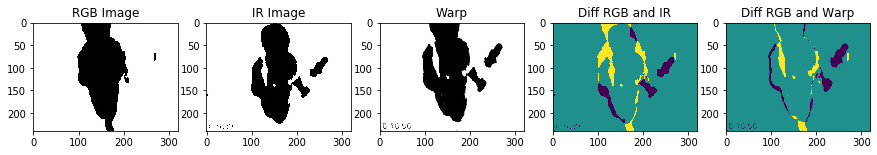

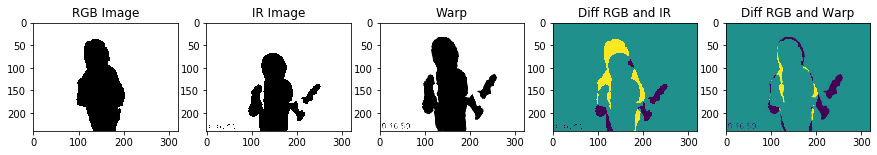

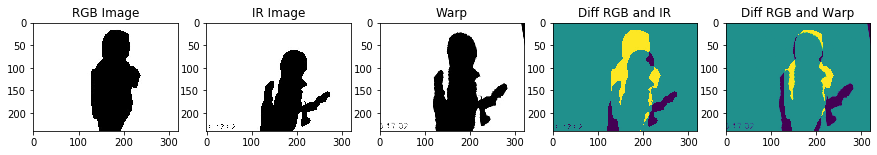

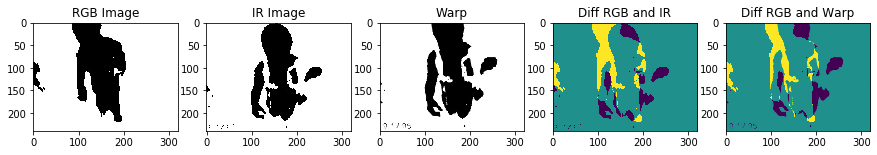

In [12]:
for i in range(0, 1000, 25):
    util.printResult(*util.getImagesById(imRGB.cpu(), imIR.cpu(), i, model.cpu()), cmap='viridis')

In [13]:
flows = util.getAllFlows(imIR, model)

flows.shape

torch.Size([1000, 240, 320, 2])

In [15]:
x = util.applyFlowToColoredImages(imgs_ir, flows, 1000, 2000)
x.shape

(1000, 240, 320, 3)

In [16]:
superposedImages = util.superposeTwoImages(imgs_rgb[1000:2000], (x*255).astype('uint8'))
superposedImages2 = util.superposeTwoImages(imgs_rgb[1000:2000], imgs_ir[1000:2000])
print(superposedImages.shape, superposedImages2.shape)

(1000, 240, 320, 3) (1000, 240, 320, 3)


C:\Users\lucaw\Documents\EPFL\BachelorProject\util.py:331: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15, 15))


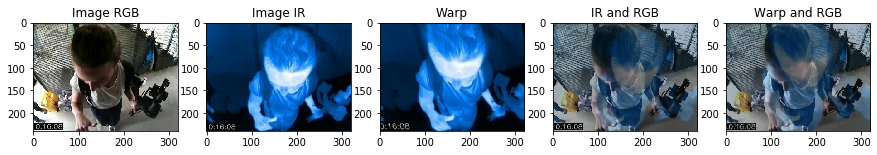

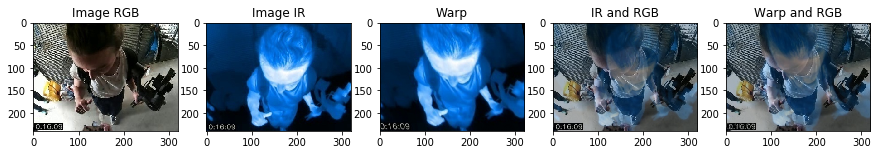

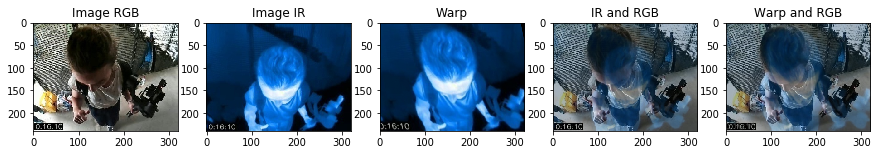

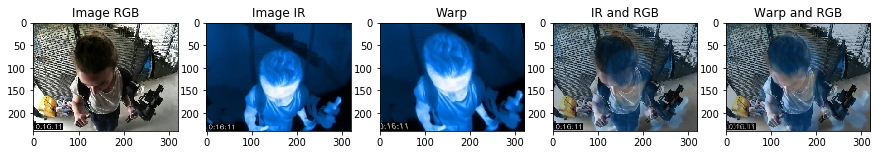

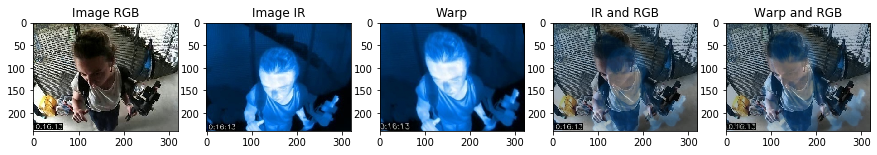

...

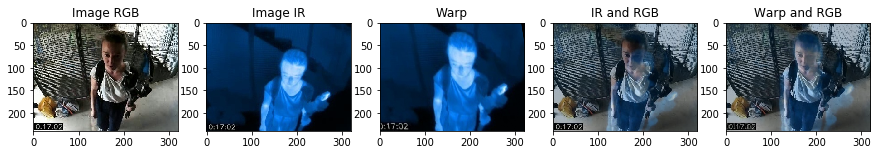

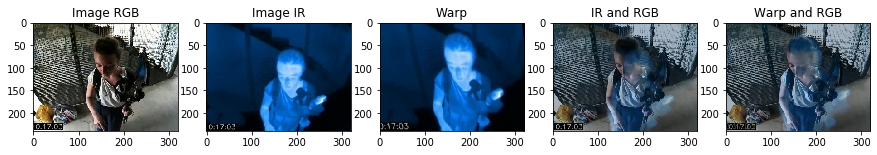

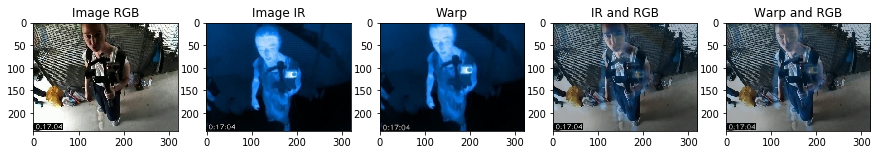

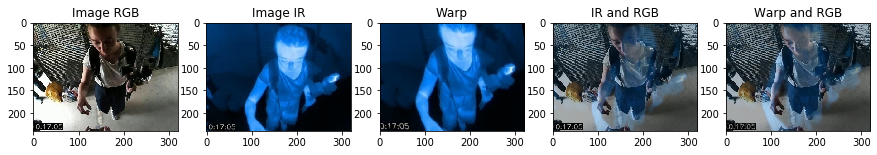

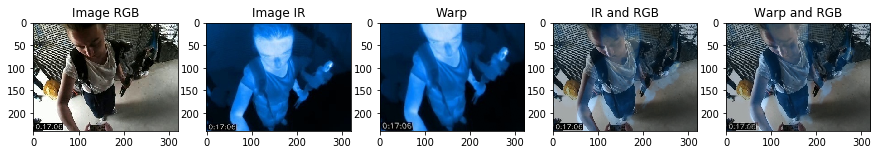

In [17]:
for i in range(500, 1000, 10):
    util.printFinal(x[i], imgs_rgb[i+1000], imgs_ir[i+1000], superposedImages[i], superposedImages2[i])